<a href="https://colab.research.google.com/github/rage-against-the-machine-learning/cs7643-DL-Group-Project/blob/plot-utilities/ResNext_POC_and_Benchmarking.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Reference: https://towardsdatascience.com/extracting-rich-embedding-features-from-coco-pictures-using-pytorch-and-resnext-wsl-vademecum-of-6fdbdbe876a8

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:

from google.colab.output import eval_js
def shrink(height="300"):
    eval_js(f'google.colab.output.setIframeHeight({height})')

Get the data - only need to run once

In [ ]:
!wget https://cs7643-raml.s3.us-west-2.amazonaws.com/valid_subset_np_imgs.zip
!wget https://cs7643-raml.s3.us-west-2.amazonaws.com/instances_valid_subset.json
!wget https://cs7643-raml.s3.us-west-2.amazonaws.com/categories.json
!wget https://cs7643-raml.s3.us-west-2.amazonaws.com/imgs_by_supercategory.json
!wget https://cs7643-raml.s3.us-west-2.amazonaws.com/val_np_imgs.zip

In [ ]:
numpy_data_path = "/content/drive/MyDrive/numpy_images"

In [ ]:
! mkdir -p {numpy_data_path}/data
! unzip -q valid_subset_np_imgs.zip -d {numpy_data_path}/data
! unzip -q val_np_imgs.zip -d {numpy_data_path}/data
! mkdir -p {numpy_data_path}/annotations
! mv instances_valid_subset.json  {numpy_data_path}/annotations
! mv categories.json {numpy_data_path}/annotations
! mv imgs_by_supercategory.json {numpy_data_path}/annotations

Set up environment

In [ ]:
! pip install --upgrade pip
! pip install torch torchvision torchsummary gca pandas numpy matplotlib seaborn scikit-learn==0.23.2 pycocotools tqdm umap-learn kneed
! pip install git+https://github.com/waleedka/cocoapi.git#egg=pycocotools&subdirectory=PythonAPI
# TODO: install the docem python package via github
! pip list
shrink()

     |████████████████████████████████| 1.6 MB 7.6 MB/s 
  Attempting uninstall: pip
    Found existing installation: pip 21.1.3
    Uninstalling pip-21.1.3:
      Successfully uninstalled pip-21.1.3
distutils: /usr/local/lib/python3.7/dist-packages
sysconfig: /usr/lib/python3.7/site-packages
distutils: /usr/local/lib/python3.7/dist-packages
sysconfig: /usr/lib/python3.7/site-packages
distutils: /usr/local/include/python3.7/UNKNOWN
sysconfig: /usr/include/python3.7m/UNKNOWN
distutils: /usr/local/bin
sysconfig: /usr/bin
distutils: /usr/local
sysconfig: /usr
user = False
home = None
root = None
prefix = None
     |████████████████████████████████| 6.8 MB 7.5 MB/s 
     |████████████████████████████████| 80 kB 12.3 MB/s 
     |████████████████████████████████| 1.1 MB 87.0 MB/s 
  Created wheel for gca: filename=gca-0.1-py3-none-any.whl size=12304 sha256=e8796e973f1693f59e2d2152609c619cf11ec2880012e1428eb47c765bd10026
  Stored in directory: /root/.cache/pip/wheels/68/85/d1/f5ac3c697ed91a03

Choose a GPU runtime

In [ ]:
import torch
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
if torch.cuda.is_available():
    print(torch.cuda.current_device())
    print(torch.cuda.device_count())
    print(torch.cuda.get_device_name(0))
    
device

0
1
Tesla T4


device(type='cuda', index=0)

Load the resnext model

In [ ]:
# small size model
model = torch.hub.load('facebookresearch/WSL-Images', 'resnext101_32x8d_wsl')

Downloading: "https://github.com/facebookresearch/WSL-Images/archive/master.zip" to /root/.cache/torch/hub/master.zip
Downloading: "https://download.pytorch.org/models/ig_resnext101_32x8-c38310e5.pth" to /root/.cache/torch/hub/checkpoints/ig_resnext101_32x8-c38310e5.pth


Remove last FC layer

In [ ]:
from torch import nn
from torchsummary import summary

# Dropping output layer (the ImageNet classifier)

def slice_model(original_model, from_layer=None, to_layer=None):
    return nn.Sequential(*list(original_model.children())[from_layer:to_layer])
model_conv_features = slice_model(model, to_layer=-1).to(device)
summary(model_conv_features, input_size=(3,224,224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 112, 112]           9,408
       BatchNorm2d-2         [-1, 64, 112, 112]             128
              ReLU-3         [-1, 64, 112, 112]               0
         MaxPool2d-4           [-1, 64, 56, 56]               0
            Conv2d-5          [-1, 256, 56, 56]          16,384
       BatchNorm2d-6          [-1, 256, 56, 56]             512
              ReLU-7          [-1, 256, 56, 56]               0
            Conv2d-8          [-1, 256, 56, 56]          18,432
       BatchNorm2d-9          [-1, 256, 56, 56]             512
             ReLU-10          [-1, 256, 56, 56]               0
           Conv2d-11          [-1, 256, 56, 56]          65,536
      BatchNorm2d-12          [-1, 256, 56, 56]             512
           Conv2d-13          [-1, 256, 56, 56]          16,384
      BatchNorm2d-14          [-1, 256,

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


Custom CocoDataset

In [ ]:
import os
import multiprocessing as mp
import random
import sys

In [ ]:
sys.path.append("/content/drive/MyDrive/dataset")
#import coco_api_helper
#import coco_data_prep
import config_dataset

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from pycocotools.coco import COCO
import torch 
from torch.utils.data import Dataset, DataLoader
from tqdm import tqdm

In [ ]:
import os
import json
with open (os.path.join(numpy_data_path, "annotations","categories.json"), 'r') as j:
    desired_categories = json.load(j)
#with open (os.path.join(numpy_data_path, "annotations", "imgs_by_supercategory.json"), 'r') as f:
#    imgid_by_supercat = json.load(f)
valid_annot = COCO("/content/drive/MyDrive/numpy_images/annotations/instances_val2014.json")
category_ids = [cat["id"] for cat in desired_categories]
img_ids = [valid_annot.getImgIds(catIds=[id]) for id in category_ids]


# flatten to a list of imgids
desired_img_ids = list(set([ii for img_id in img_ids for ii in img_id]))

loading annotations into memory...
Done (t=9.61s)
creating index...
index created!


In [ ]:
test = valid_annot.loadImgs(desired_img_ids)
subset_list = os.listdir("/content/drive/MyDrive/numpy_images/data/valid_subset")
test_dict = dict(zip(desired_img_ids, [item["file_name"].replace(".jpg",".np") for item in test]))
final = {k: v for (k, v) in test_dict.items() if v in subset_list}
desired_img_ids = list(final.keys())

In [ ]:
class COCODataset(Dataset):
    def __init__(self,
                 np_img_data_dir,
                 annot_filepath,
                 sample_ratio: float = None,
                 device="cpu"):
        """
        :np_img_data_dir: local directory where you have unzipped np files saved 
            np files are the trasnformed images from s3 that were normalized/ resized/ padded
        :annot_filepath: filepath of the original coco dataset corresponding to the datasplit of your choosing
        :sample_ratio: specified float between 0 and 1 for the % of images from the data split you want to use
        :device: cpu or gpu
        """
        self.device = device
        self.np_img_data_dir = np_img_data_dir

        self.sample_ratio = sample_ratio
        self.coco = COCO(annot_filepath)

        # All possible image ids
        all_train_img_ids = list(self.coco.imgs.keys())
        # Filter down to the image ids applicable to our supercategories
        
        self.ids = [ii for ii in tqdm(all_train_img_ids) if ii in desired_img_ids]

        if self.sample_ratio is None:
            pass
        else:
            self.ids = list(np.random.choice(self.ids, int(self.sample_ratio * len(self.ids)), replace=False))

    def __getitem__(self, index):
        coco = self.coco

        img_id = self.ids[index]
        ann_ids = coco.getAnnIds(imgIds=[img_id])
        target = coco.loadAnns(ann_ids)

        path = coco.loadImgs([img_id])[0]['file_name']
        np_path = path.split('.')[0] + '.np'
        img = np.load(os.path.join(self.np_img_data_dir, np_path))
        
        # Convert the image to tensor so it's compatible w/ pytorch data loader
        img = torch.Tensor(img.transpose(2,0,1)).to(device=self.device).float()

        return img, target

    def __len__(self):
        return len(self.ids)
    
def get_dataloader(dataset_obj,
                   batch_size: int=100,
                   device=torch.device("cuda:0" if torch.cuda.is_available() else "cpu"),
                   loader_params:dict = {"shuffle" : False,
                                         "num_workers": mp.cpu_count(),
                                         "collate_fn": lambda x: x}):
    """Returns data loader for custom dataset.
    Args:
        :dataset_obj: dataset object returned from COCODataset class
        :batch_size: specified batch size, if you have memory errors while running, make this smaller
        :device: default is CUDA if there is GPU otherwise CPU
        :loader_params: default is found in config_dataset.py's dataloader_params dict
            can specify your own data loader params, but collate_fn must be `lambda x: x`
            specify:
                shuffle: True / False
                num_workers: number of parallel processes to run
                collate_fn: lambda x: x
    Returns:
        data_loader: data loader for COCODataset.
    """
    # data loader for custom dataset
    # this will return (imgs, targets) for each iteration
    loader_params.update({'batch_size': batch_size})
    
    data_loader = DataLoader(
        dataset=dataset_obj, 
        **loader_params,
    )
    return data_loader


Dataset and DataLoader

In [ ]:
np_data_dir = "/content/drive/MyDrive/numpy_images/data/valid_subset"
np_annot_dir = "/content/drive/MyDrive/numpy_images/annotations/instances_val2014.json"

In [ ]:
len(desired_img_ids)

20874

In [ ]:
len(os.listdir(np_data_dir))

20874

In [ ]:
val_dataset = COCODataset(np_data_dir, np_annot_dir, sample_ratio=None)

loading annotations into memory...
Done (t=5.95s)
creating index...


  0%|          | 140/40504 [00:00<00:28, 1399.29it/s]

index created!


100%|██████████| 40504/40504 [00:24<00:00, 1626.48it/s]


In [ ]:
from torch.utils.data import DataLoader
from torch.multiprocessing import Pool, Process, set_start_method
import torch.multiprocessing
cpu_count = torch.multiprocessing.cpu_count()
print('cpus', cpu_count)

try: 
  set_start_method("spawn")
except RuntimeError:
  pass
batch_size = 64

val_dl = torch.utils.data.DataLoader(dataset=val_dataset, 
                                          batch_size=batch_size,
                                          shuffle=False,
                                          num_workers=cpu_count,
                                          collate_fn=lambda x: x)

cpus 4


Generate embeddings

In [ ]:
features_list = []
labels_list = []

# Use GPUs to speed up the inference, this should take around 10 minutes

model_conv_features.to(device)
for batch in tqdm(val_dl):
    image_batch, label_batch = [x[0] for x in batch], [x[1] for x in batch]
    image_batch = torch.stack(image_batch).to(device) 

    with torch.no_grad():
        features_batch = model_conv_features(image_batch).flatten(start_dim=1)
    features_list.append(features_batch)
    labels_list.extend(label_batch)

100%|██████████| 327/327 [56:03<00:00, 10.29s/it]


In [ ]:
features = torch.cat(features_list)
features.shape

torch.Size([20874, 2048])

In [ ]:
X = features.to("cpu").numpy()

In [ ]:
resnext_labels

Embedding to image_id mapping

In [ ]:
image_map = [item[0]["image_id"] for item in labels_list]
embed_pos_to_image_id = dict(zip(range(len(image_map)), image_map))
embedding_dict = {value : X[key] for key, value in embed_pos_to_image_id.items()}

In [ ]:
# extract and concat labels, None in case of multiple labels
from collections import Counter

category_labels=[]
category_multi_labels = []
category_multi_labels_counts = []
supercategory_labels = []
supercategory_multi_labels = []
supercategory_multi_labels_counts = []
image_ids = []


coco=COCO(np_annot_dir)
cats = coco.loadCats(coco.getCatIds())
cat_id_to_name_dict = {cat['id']: cat['name'] for cat in cats}


cats_dict = {cat['id']: cat for cat in cats}
for label in labels_list:
    
    if len(label) > 0:
        categories = []
        supercategories = []
        
        for annotation in label:
            categories.append(cats_dict[annotation['category_id']]['name'])
            supercategories.append(cats_dict[annotation['category_id']]['supercategory'])
        category_multi_labels_counts.append(categories)
        category_multi_labels.append(list(set(categories)))
        supercategory_multi_labels.append(list(set(supercategories)))
        supercategory_multi_labels_counts.append(supercategories)

        # most common category among objects in the picture
        category, _ = Counter(categories).most_common(1)[0]
        supercategory, _ = Counter(supercategories).most_common(1)[0]
        
        image_ids.append(label[0]['image_id'])
        category_labels.append(category)
        supercategory_labels.append(supercategory)
    else:
        supercategory_multi_labels.append([])
        supercategory_multi_labels_counts.append([])
        category_multi_labels.append([])
        category_multi_labels_counts.append([])
        category_labels.append(None)
        supercategory_labels.append(None)
        image_ids.append(None)
        
len(category_labels), len(supercategory_labels), len(image_ids), len(supercategory_multi_labels), len(category_multi_labels), len(supercategory_multi_labels_counts), len(category_multi_labels_counts)

loading annotations into memory...
Done (t=5.45s)
creating index...
index created!


(20874, 20874, 20874, 20874, 20874, 20874, 20874)

Dimensionality Reduction

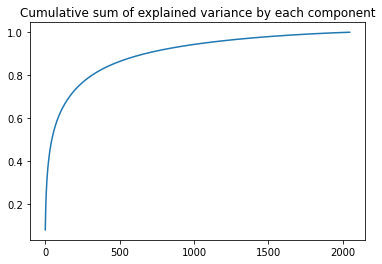

In [ ]:
from sklearn.decomposition import PCA
pca = PCA(n_components=X.shape[1])
X_pca = pca.fit_transform(X)
plt.plot(range(X_pca.shape[1]), np.cumsum(pca.explained_variance_ratio_))
plt.title('Cumulative sum of explained variance by each component')
plt.show()

In [ ]:
# Reducing the dimensionality to 3 for visualization purposes
from sklearn.manifold import TSNE
tsne3 = TSNE(n_components=3, verbose=1,random_state=46, 
              perplexity=40, n_iter=300)
X_tsne = tsne3.fit_transform(X)
X_tsne.shape

In [ ]:
#3d plot
import pandas as pd
#TODO: replace with interactive plotly such that we may not need the tensorboard
def plot_3d(X_tsne, labels, title=None, columns=['x0', 'x1', 'x2'], **kwargs):
    import matplotlib.pyplot as plt
    from mpl_toolkits.mplot3d import Axes3D
    df = pd.DataFrame(X_tsne, columns=columns)
    df['label'] = labels
    cmap = plt.get_cmap('gist_rainbow')
    unique_labels = list(set(labels))
    labels_dict = {label: i for i, label in enumerate(unique_labels)}
    num_colors = len(unique_labels)
    c = [cmap(1.*labels_dict[label]/num_colors) for label in labels]

    df['c'] = c
    df = df[~df['label'].isna()]
    ax = plt.figure(figsize=(16,10)).gca(projection='3d')
    
    for label, grp in df.groupby('label'):
        ax.scatter(
        xs=grp[columns[0]], 
        ys=grp[columns[1]], 
        zs=grp[columns[2]], 
        c=grp['c'], 
        label=label,
        **kwargs
    #     cmap='gist_rainbow'
    )
    
    ax.set_xlabel(columns[0])
    ax.set_ylabel(columns[1])
    ax.set_zlabel(columns[2])
    
    plt.legend(loc='best')
    if title:
        plt.title(title)
    plt.show()

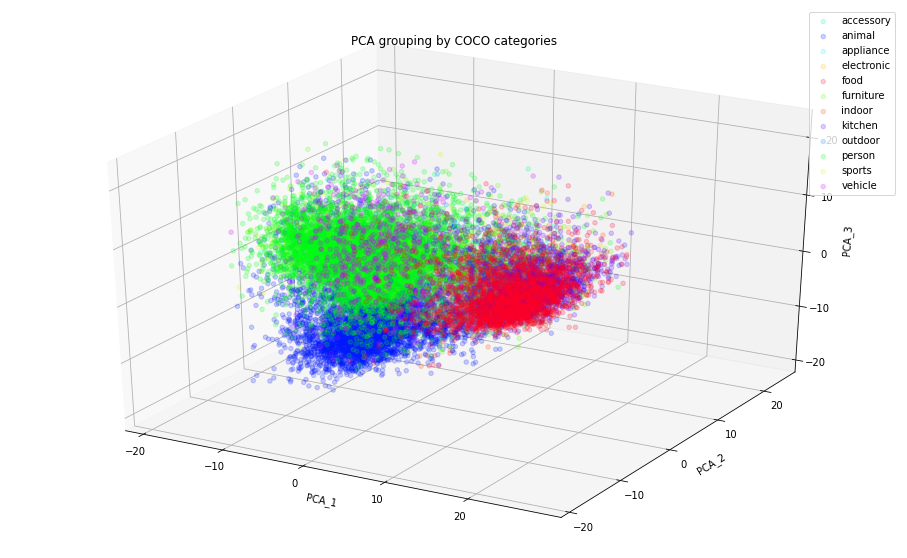

In [ ]:
plot_3d(X_pca[:, :3], supercategory_labels, 'PCA grouping by COCO categories', columns=['PCA_1', 'PCA_2', 'PCA_3'], alpha=0.2)

Nearest Neighbors

In [ ]:
from sklearn.neighbors import NearestNeighbors

nbrs = NearestNeighbors(n_neighbors=16, algorithm='auto', metric='cosine').fit(X)
nbrs

NearestNeighbors(algorithm='auto', leaf_size=30, metric='cosine',
                 metric_params=None, n_jobs=None, n_neighbors=16, p=2,
                 radius=1.0)

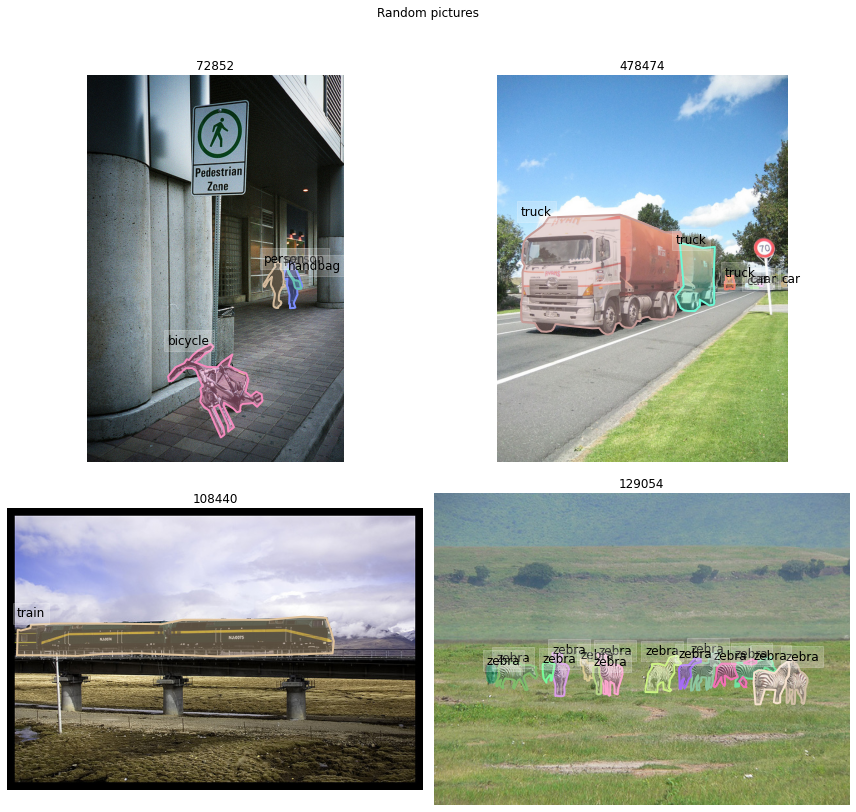

In [ ]:
# load and display instance annotations

import skimage.io as io
import matplotlib.pyplot as plt
import pylab
import numpy as np
import itertools

def plot_coco_images(img_ids, show_labels=True,
                     show_annotations=False, title_suffix=None, figtitle=None):
    nrows = len(img_ids)
    ncols = len(img_ids[0])

    fig = plt.figure(figsize=(ncols*6, nrows*6))

    for i, img_id in enumerate(itertools.chain(*img_ids)):
        ax = fig.add_subplot(nrows, ncols, i+1)
        img = coco.loadImgs(img_id)[0]
        I = io.imread(img['coco_url'])

        ax.imshow(I, aspect='equal', )
        ax.axis('off')
        
        if title_suffix is not None:
            title=f'{img_id}: {title_suffix[i//nrows, i%ncols]}'
        else:
            title = str(img_id)
        ax.set_title(title)

    
        annIds = coco.getAnnIds(imgIds=img['id'], iscrowd=None)
        anns = coco.loadAnns(annIds)
        if show_annotations:
            coco.showAnns(anns)

        if show_labels:
            for ann in anns:
                [x, y, _, _] = ann['bbox']
                label = cat_id_to_name_dict[ann['category_id']]

                t=ax.annotate(label, (x,y), fontsize=12)
                t.set_bbox(dict(facecolor='white', alpha=0.2, edgecolor='white'))

    plt.tight_layout()
    
    if figtitle:
        fig.suptitle(figtitle)
        plt.subplots_adjust(top=0.90)
    plt.show()

plot_coco_images([[72852, 478474], [108440, 129054]], 
                 figtitle='Random pictures', show_annotations=True)

In [ ]:
def plot_neighbors(X_idx, idx2Img, X,  nbrs, show_annotations=False):
    m, n = np.shape(X)
    img_id = idx2Img[X_idx]
    img_index = np.argwhere(np.array(image_ids) == img_id)[0]

    distances, indices = nbrs.kneighbors(X[X_idx, :].reshape(1, n), 16)
    distances, indices = distances[0], indices[0]
    neighbors_ids = np.array(list(map(idx2Img.get, indices)))
    np.insert(neighbors_ids, 0, img_id)
    np.insert(distances, 0, 0)
    
    title_suffix = np.array([f'distance={distance:.2f}' for distance in distances])
    figtitle=f'Neighbors of {img_id}'
    plot_coco_images(neighbors_ids.reshape(4, 4).tolist(), 
                     title_suffix=title_suffix.reshape(4,4),
                     show_annotations=show_annotations,
                     figtitle=figtitle)

In [ ]:
embed_pos_to_image_id[75]

93201

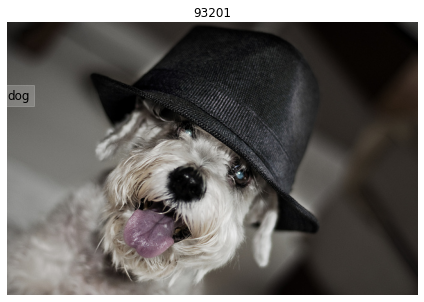

In [ ]:
plot_coco_images([[93201]])

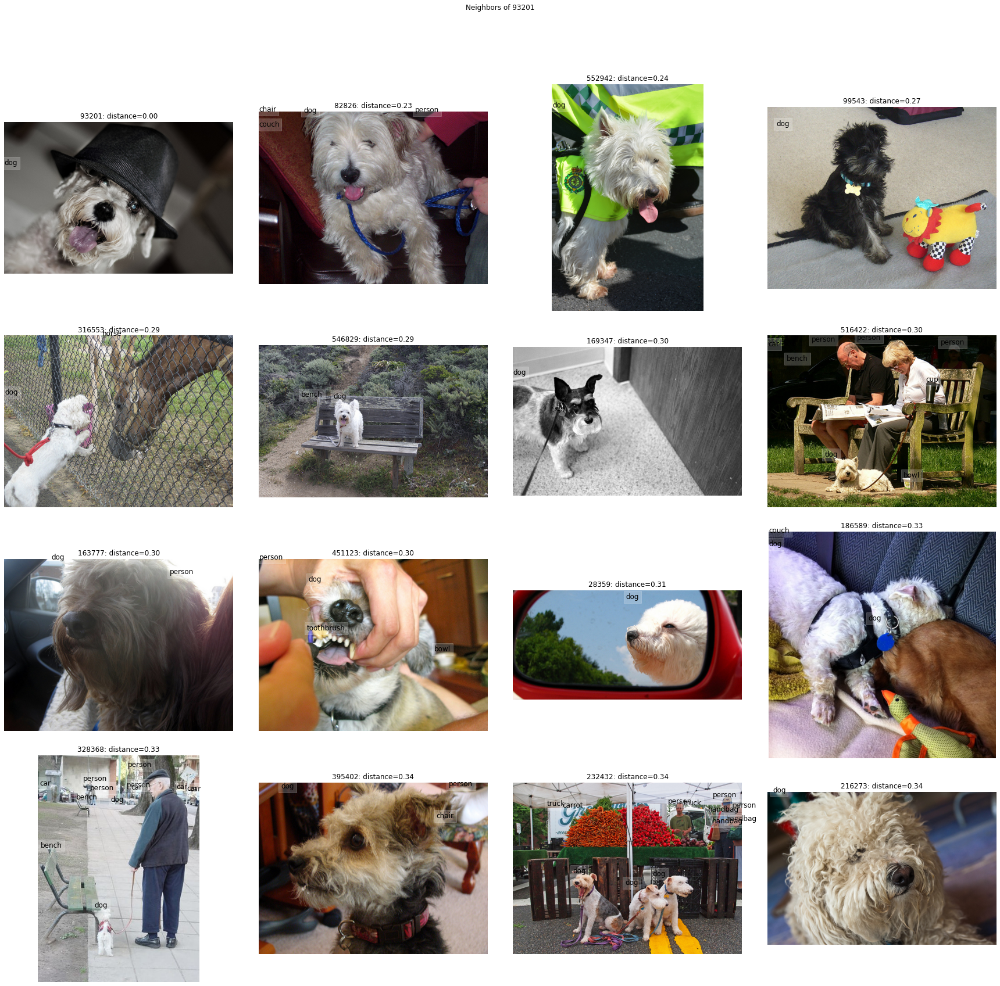

In [ ]:
plot_neighbors(75, embed_pos_to_image_id, X, nbrs)

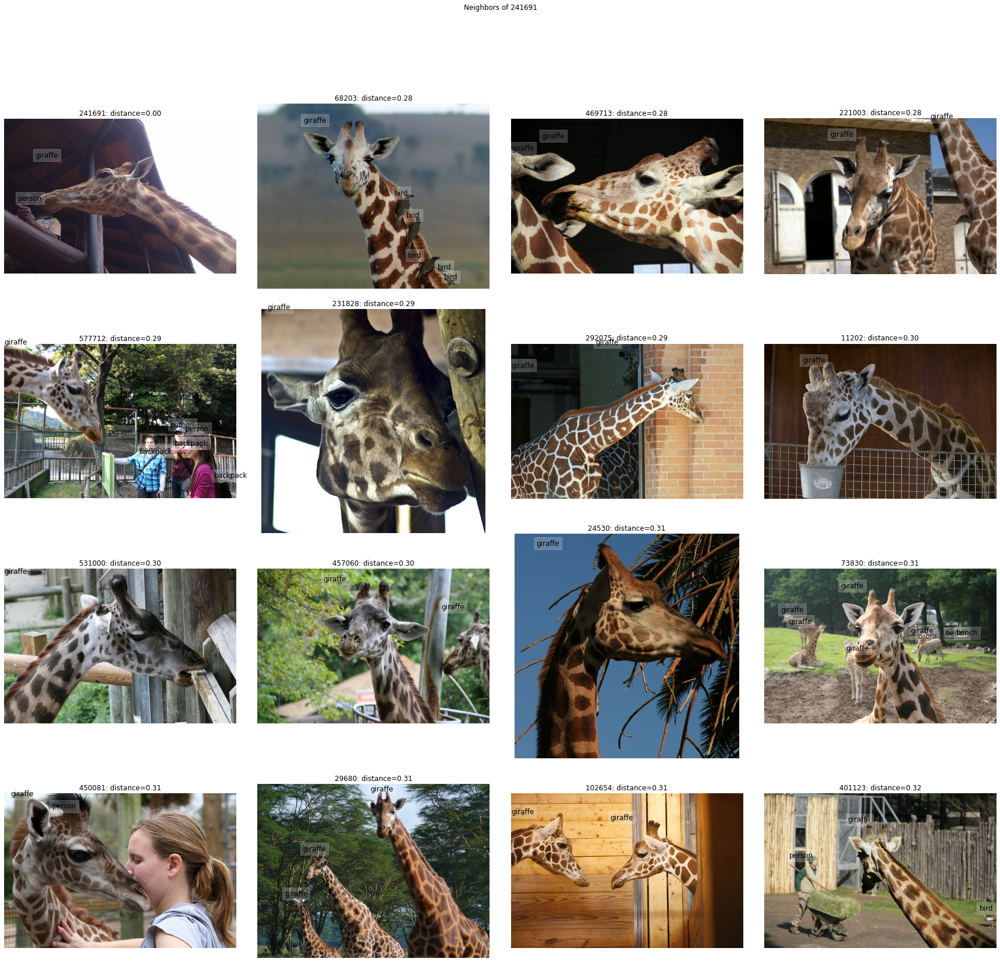

In [ ]:
plot_neighbors(50, embed_pos_to_image_id, X, nbrs)

Save embeddings

In [ ]:
model_name = "resnext"
torch.save(features,"{}_embeddings.pt".format(model_name))

In [ ]:
features.size()

torch.Size([20874, 2048])

In [ ]:
embedding_dict = {value : list(X[key]) for key, value in embed_pos_to_image_id.items()}

In [ ]:
import json

with open('resnext_embeddings.json', 'w') as fp:
    json.dump(embed_pos_to_image_id, fp)

In [ ]:
valid_annot

In [ ]:
with open('resnext_embeddings.json', 'r') as fp:
    data = json.load(fp)